# Data Transforms

Rotation
Flip
Color Jitter

In [2]:
from data_preparation import *
from utils import *
from shutil import copy
from PIL import Image
from torchvision import transforms
from data_transforms import *
import numpy as np

base_path = Path("E:/Users/joaor/NSP/2021")
if(Path().cwd() != Path(r"E:\Users\joaor\NSP\2021")):
    os.chdir(base_path)

folder_path = Path("spaced_data_splits/all_separated_frames/")

check_dir(folder_path)

In [9]:
folder_path = Path("spaced_data_splits/spaced_data_separated")
vp_cnt = 0
p_cnt = 0
m_cnt = 0
g_cnt = 0

for i,video in enumerate(list(folder_path.iterdir())):
    
    for quality in list(video.iterdir()):
        files = list(quality.glob('*'))
        file_count = len(files)

        name = quality.stem

        if name == "Very Poor":
            vp_cnt += file_count
        elif name == "Poor":
            p_cnt += file_count
        elif name == "Moderate":
            m_cnt += file_count
        elif name == "Good":
            g_cnt += file_count

print("Good:", g_cnt ," / Moderate:", m_cnt, " / Poor:", p_cnt, " / Very Poor:", vp_cnt)

Good: 1064  / Moderate: 968  / Poor: 1021  / Very Poor: 130


In [11]:
folder_path_dst = Path("spaced_data_splits/all_separated_frames")
check_dir(folder_path_dst)

# vp_cnt = 0
# p_cnt = 0
# m_cnt = 0
# g_cnt = 0

# for i,video in enumerate(list(folder_path.iterdir())):
    
#     for quality in list(video.iterdir()):
#         files = list(quality.glob('*'))
#         file_count = len(files)

#         name = quality.stem

#         check_dir(folder_path_dst/name)

#         if name == "Very Poor":
#             vp_cnt += file_count
#             for file in files:
#                 copy(file,folder_path_dst/name)
#         if name == "Poor":
#             p_cnt += file_count
#             for file in files:
#                 copy(file,folder_path_dst/name)
#         elif name == "Moderate":
#             m_cnt += file_count
#             for file in files:
#                 copy(file,folder_path_dst/name)
#         elif name == "Good":
#             g_cnt += file_count
#             for file in files:
#                 copy(file,folder_path_dst/name)


## Ideia inicial de fazer 8 tipos de transformações diferentes e aplicar todas a cada imagem de modo a manter a original e as 8 modificadas fazendo assim x9 ao dataset.

Acabei por não seguir com esta ideia porque achei biased ter sempre as mesmas transformações. Assim parti para a ideia de inserir mais randomness no dataset.

Video_11_Poor_2_1_frame9000


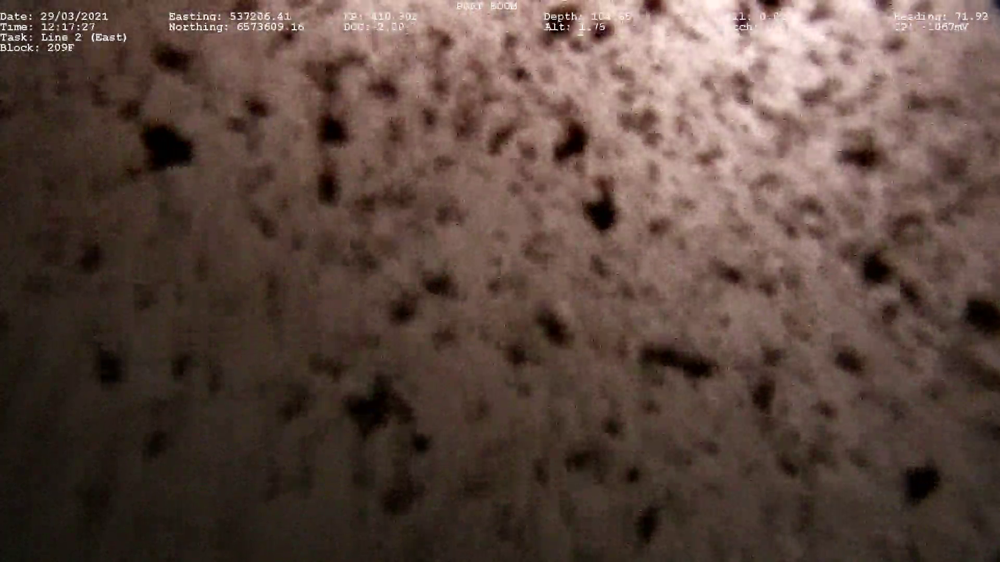

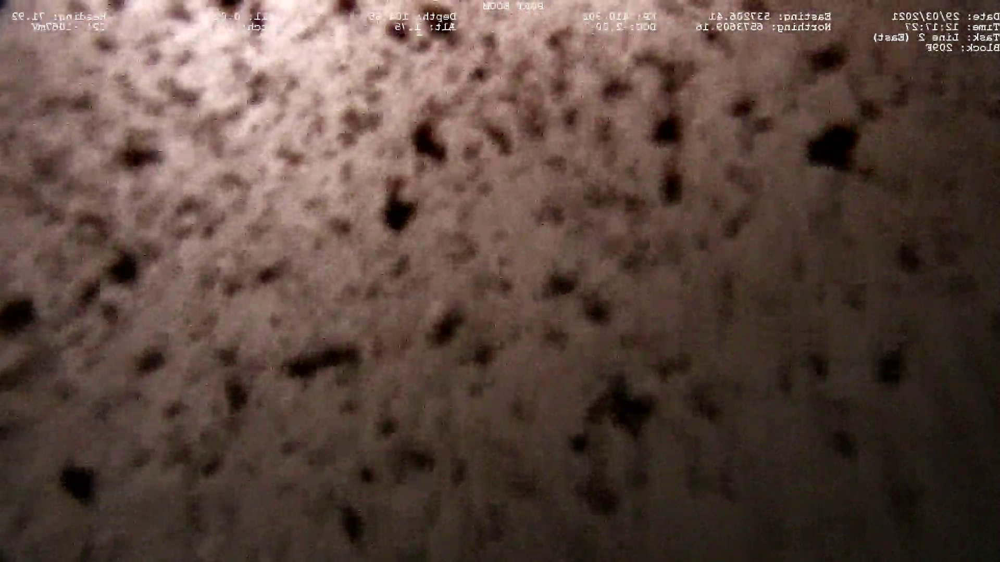

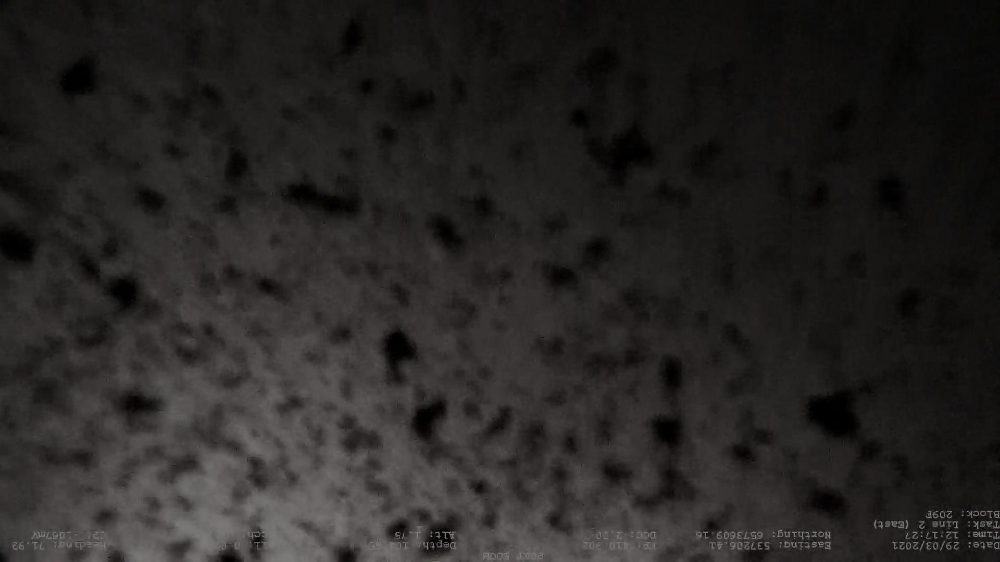

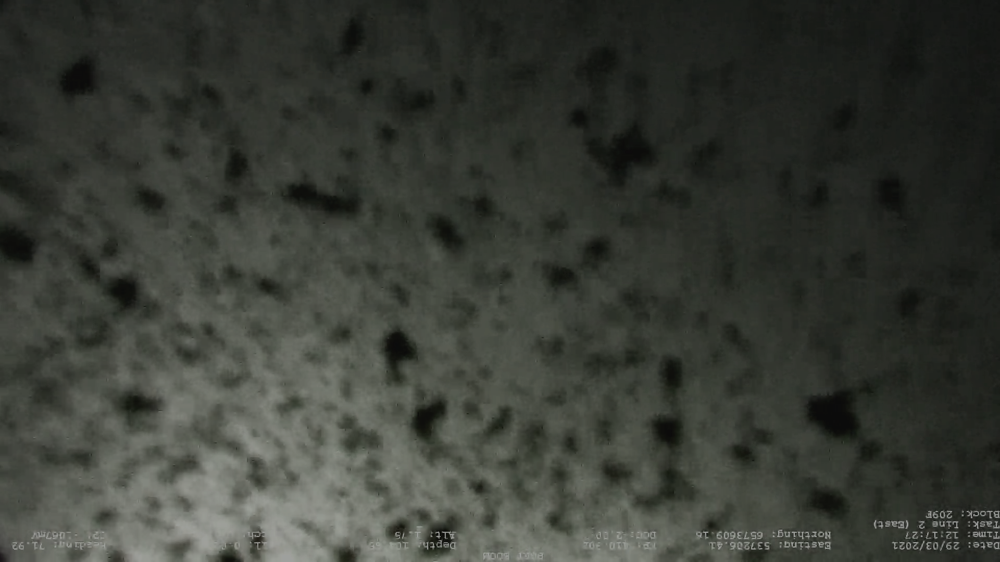

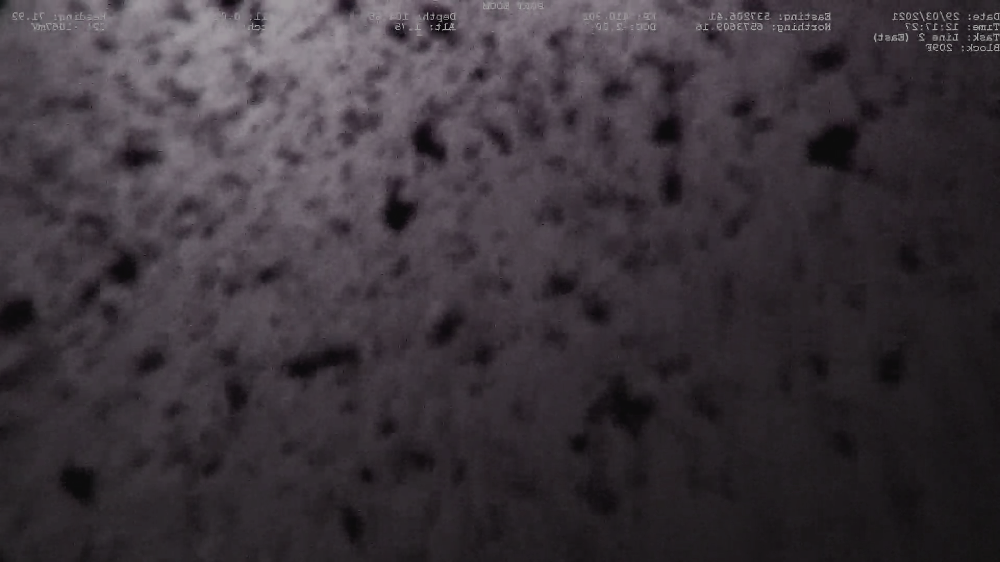

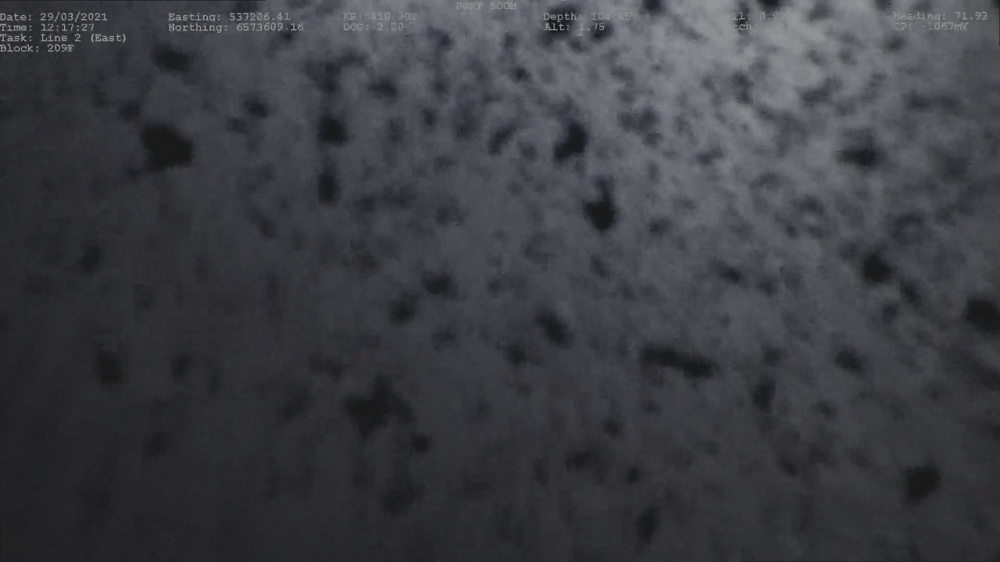

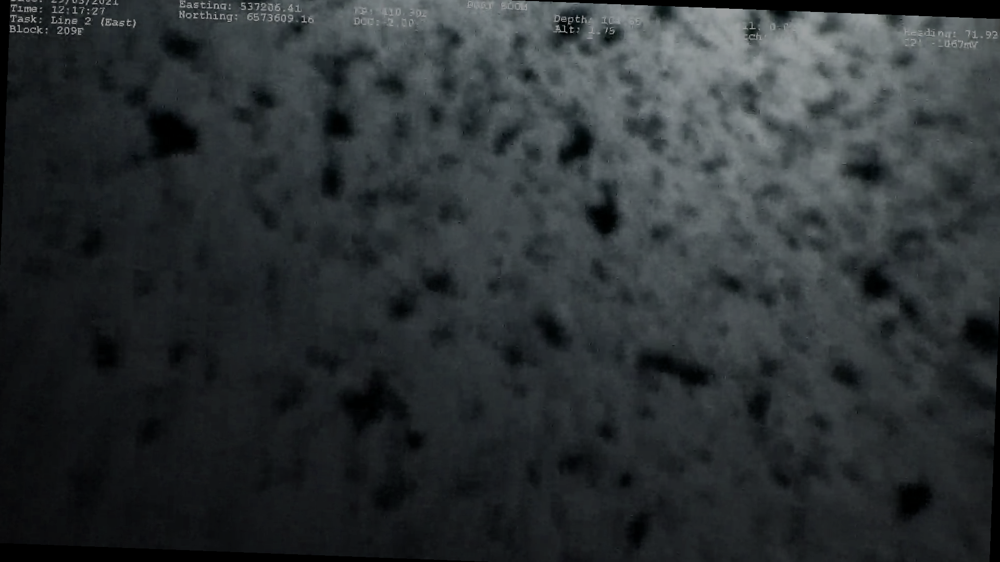

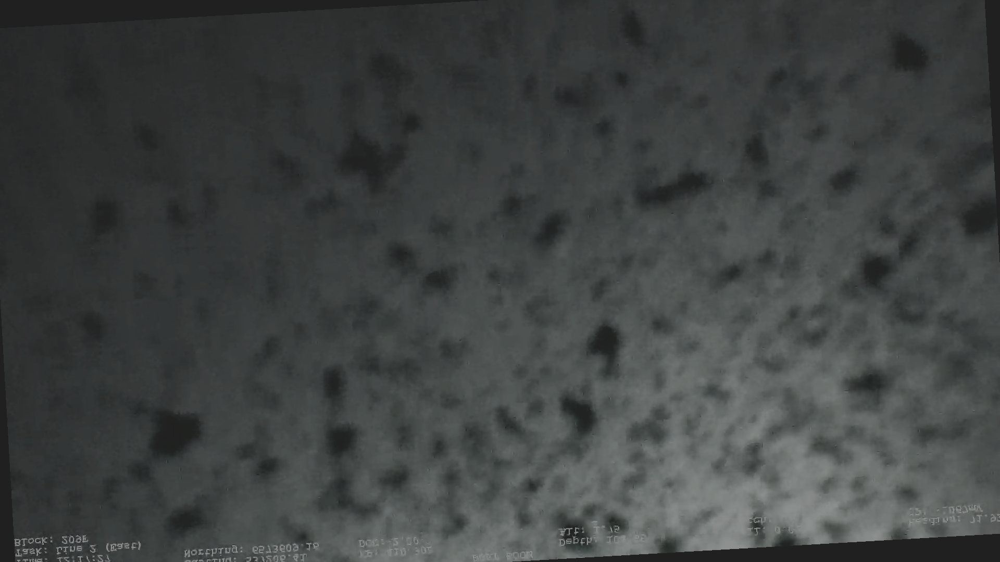

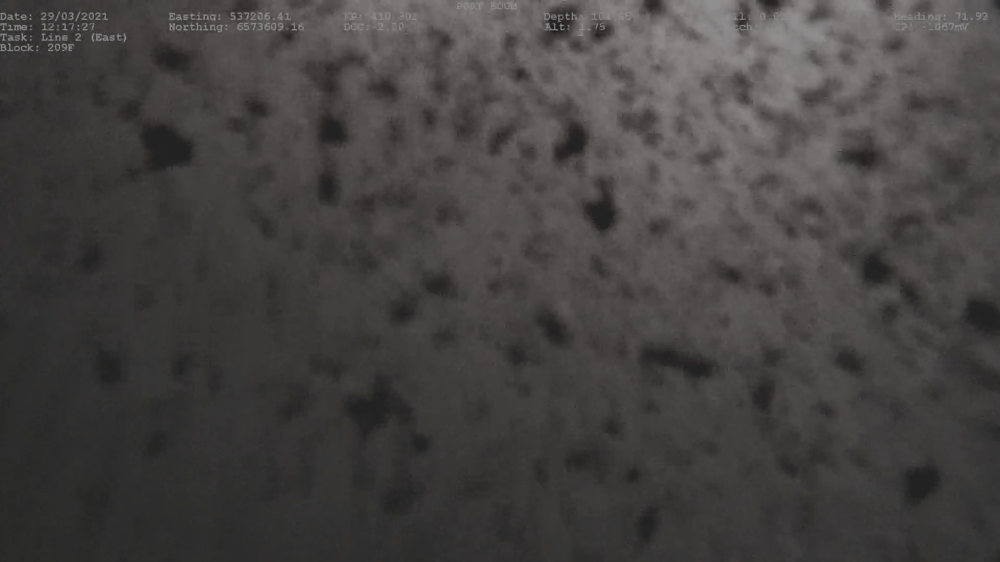

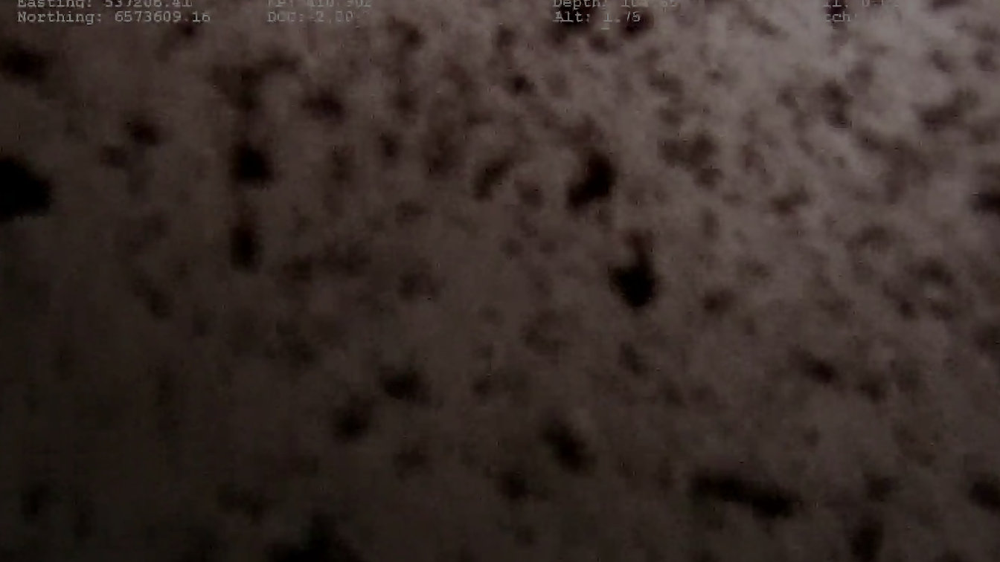

In [37]:
#Load an example
image_shape = (1080, 1920)
resize_factor = 0.7
resize = np.multiply(image_shape,resize_factor)
resize = [int(resize[0]), int(resize[1])]

path = Path(folder_path_dst / "Very Poor" / "Video_11_Poor_2_1_frame9000.png")

img = Image.open(path)

transform_0 = transforms.Compose([transforms.RandomHorizontalFlip(p=1)])

transform_1 = transforms.Compose([transforms.RandomHorizontalFlip(p=1),
                                  transforms.RandomVerticalFlip(p=1),
                                  transforms.ColorJitter((0.5,0.5),(1,1),(0.2,0.2),(0,0))])

transform_2 = transforms.Compose([transforms.RandomHorizontalFlip(p=1),
                                  transforms.RandomVerticalFlip(p=1),
                                  transforms.ColorJitter((0.75,0.75),(0.8,0.8),(0.4,0.4),(0.2,0.2))])

transform_3 = transforms.Compose([transforms.RandomHorizontalFlip(p=1),
                                  transforms.ColorJitter((0.75,0.75),(0.8,0.8),(0.4,0.4),(-0.2,-0.2))])

transform_4 = transforms.Compose([transforms.RandomRotation(5),
                                  transforms.ColorJitter((0.85,0.85),(0.6,0.6),(0.4,0.4),(-0.4,-0.4))])

transform_5 = transforms.Compose([transforms.RandomRotation(5),
                                  transforms.ColorJitter((0.65,0.65),(1,1),(0.4,0.4),(0.5,0.5))])

transform_6 = transforms.Compose([transforms.RandomRotation(5),
                                  transforms.RandomVerticalFlip(p=1),
                                  transforms.ColorJitter((0.9,0.9),(0.5,0.5),(0.3,0.3),(0.4,0.4))])

transform_7 = transforms.Compose([transforms.ColorJitter((0.9,0.9),(0.5,0.5),(0.2,0.2),(0,0))])

transform_8 = transforms.Compose([transforms.RandomCrop(resize),
                                  transforms.ColorJitter((0.5,0.5),(1,1),(0.9,0.9),(0,0))])




# increase = 9

# for i in range(increase):
#     img = transform_1(img)
#     img.save("try/" + path.stem + "_" + str(i) + "_" +".png")

print(path.stem)

img_0 = transform_0(img)
img_1 = transform_1(img)
img_2 = transform_2(img)
img_3 = transform_3(img)
img_4 = transform_4(img)
img_5 = transform_5(img)
img_6 = transform_6(img)
img_7 = transform_7(img)
img_8 = transform_8(img)


display(img)
display(img_0)
display(img_1)
display(img_2)
display(img_3)
display(img_4)
display(img_5)
display(img_6)
display(img_7)
display(img_8)


# all_images = glob.glob( str(folder_path_dst) + "/Very Poor/*.png")
# print(all_images)

## Como as imagens de Very Poor quality não estão dependentes da existencia ou não de uma pipeline, são basicamente ruído ou cores sólidas, surgiu a ideia de recortar cada imagem em 4 pedaços iguais. Ou seja, assim passei de ~130 -> ~520 frames (sendo que esta modificação não influencia em termos de qualidade o input que eu dou as neworks como é possivel ver no output da próxima célula)

original


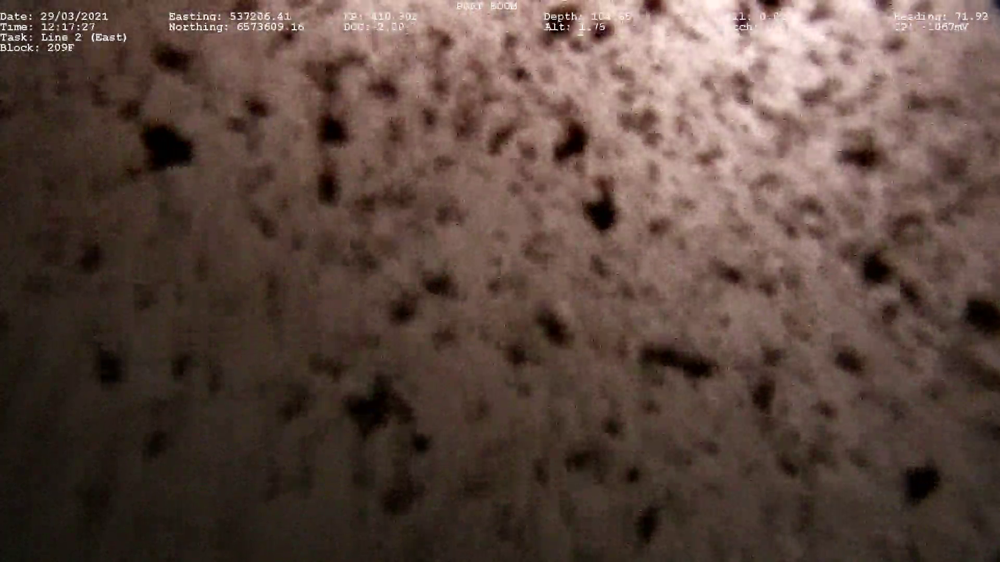

1


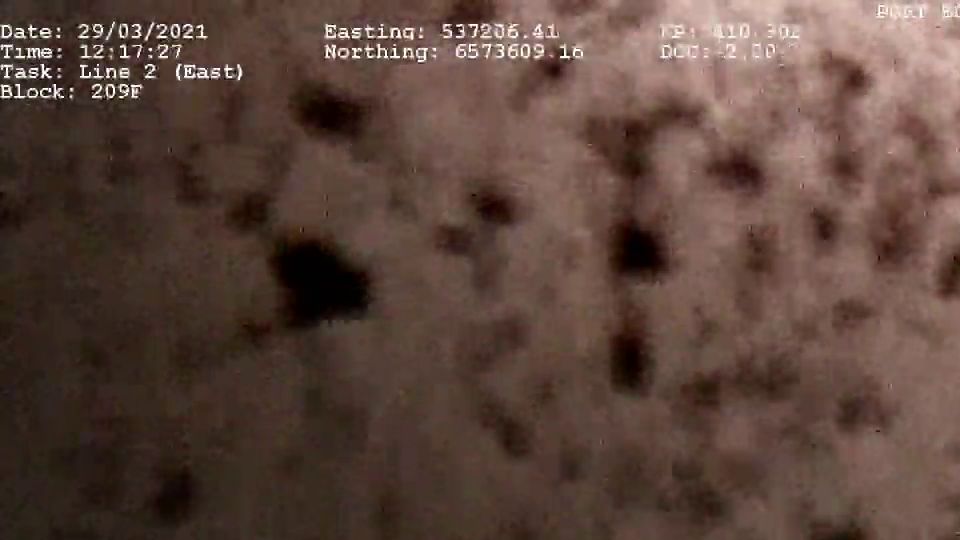

2


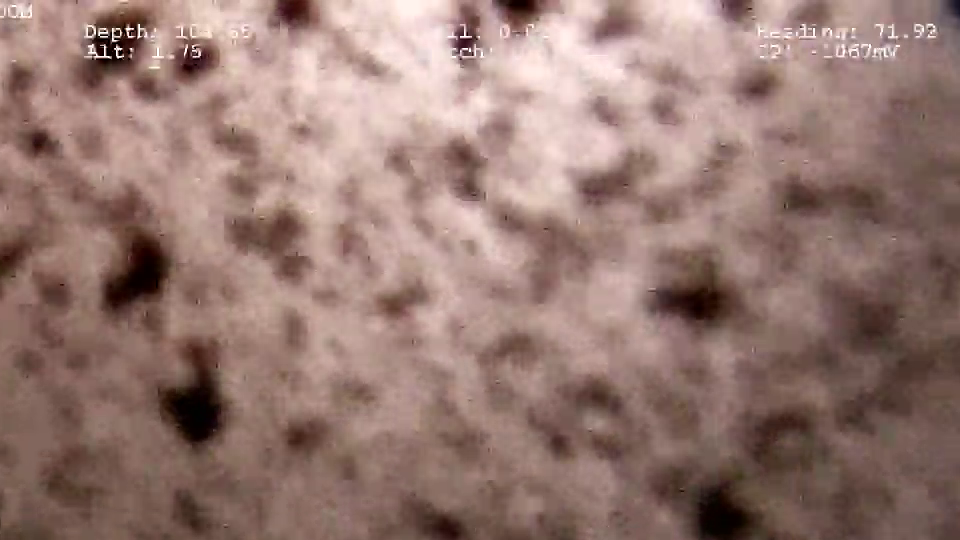

3


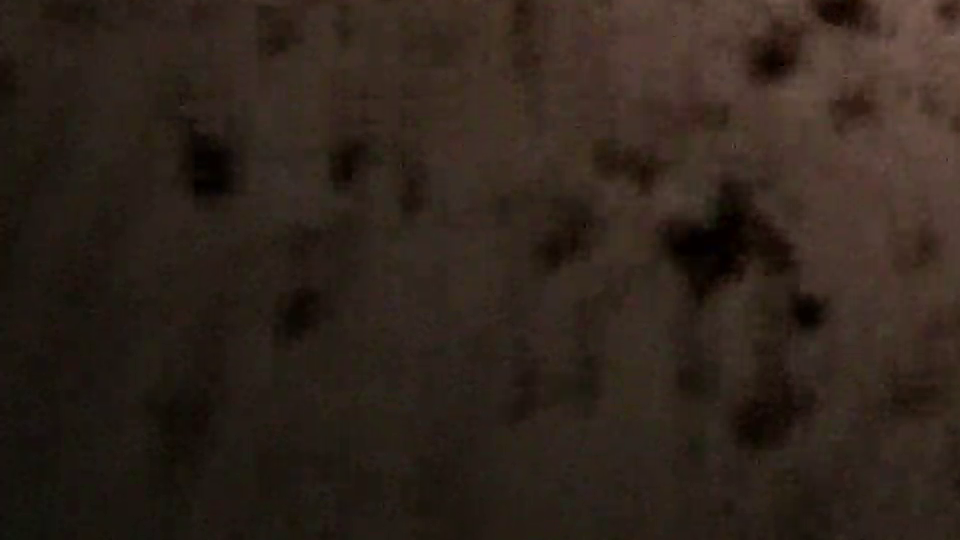

4


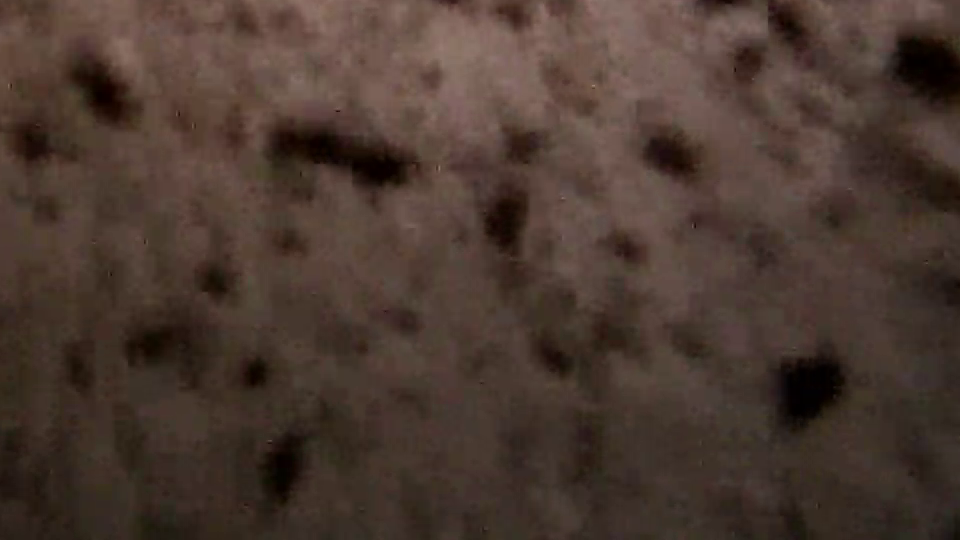

exp


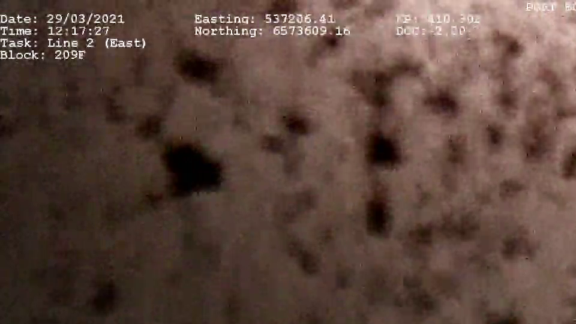

(960, 540)
(576, 324)
324.0 /// 576.0


In [18]:
image_shape = (1080, 1920)
resize_factor = 0.3
resize = np.multiply(image_shape,resize_factor)
resize = [int(resize[0]), int(resize[1])]

path = Path("spaced_data_splits/all_separated_frames/Very Poor/" + "Video_11_Poor_2_1_frame9000.png")

image = Image.open(path)

img1, img2, img3, img4 = splitFour(image)

res_transform = transforms.Resize(resize)

img_exp = res_transform(img1)

print("original")
display(image)
print("1")
display(img1)
print("2")
display(img2)
print("3")
display(img3)
print("4")
display(img4)
print("exp")
display(img_exp)

print(img1.size)
print(img_exp.size)

print(1080*0.3, "///", 1920*0.3)

## Como o objetivo é obter ~1000 imagens (dobrar o numero de imagens), para cada sample mantive a original e a estas apliquei:

Cor - Ambas as modificações para que os modelos fiquem mais robustos e não fiquem dependentes de cor.
- Modificar a cor com color jitter - tunned para resultados aceitaveis
- Adicionar probabilidade de 10% da imagem se tornar preto e branco

Transformaçoes espaciais
- Rodar ligeiramente as images de modo a não perder informação.
- Dar flip horizontais e verticais as images.

In [5]:
all_images = glob.glob( str(folder_path_dst) + "/Very Poor/*.png")

aug_path = Path("DataAugmentation/VP_Augmented_4Crop_512")
check_dir(aug_path)

# for image_path in all_images:
#     image_path = Path(image_path)
#     image = Image.open(image_path)

#     img1, img2, img3, img4 = splitFour(image)

#     img1.save( str(aug_path) + "/" + image_path.stem + "_" + str(1) +".png")
#     img2.save( str(aug_path) + "/" + image_path.stem + "_" + str(2) +".png")
#     img3.save( str(aug_path) + "/" + image_path.stem + "_" + str(3) +".png")
#     img4.save( str(aug_path) + "/" + image_path.stem + "_" + str(4) +".png")


In [13]:
aug_path_1 = Path("spaced_data_splits/DataAugmentation/VP_Augmented_4Crop_Color_1024")
check_dir(aug_path_1)

image_shape = (1080, 1920)
resize_factor = 0.7
resize = np.multiply(image_shape,resize_factor)
resize = [int(resize[0]), int(resize[1])]

transform_all = transforms.Compose([
    transforms.RandomVerticalFlip(p=0.6),
    transforms.RandomHorizontalFlip(p=0.6),
    transforms.RandomRotation(5),
    transforms.ColorJitter((0.9,1.05),(0.8,1.2),(0.9,1.1),(-0.2,0.2)),
    transforms.RandomApply(torch.nn.ModuleList([transforms.Grayscale()]),p=0.1)
])

iter = 1

all_images = glob.glob( str(aug_path) + "/*.png")

for image_path in all_images:
    image_path = Path(image_path)
    image = Image.open(image_path)
    image.save( str(aug_path_1) + "/" + image_path.stem +".png")
    for i in range(iter):
        image = transform_all(image)
        image.save( str(aug_path_1) + "/" + image_path.stem + "_" + str(i) +".png")


# Splitting the data by video, so that i have different videos in training and validation/test

In [38]:
aug_path_2 = Path("spaced_data_splits/DataAugmentation/VP_Augmented_4Crop_Color_1024_byVideo")

for dir in list(aug_path_1.iterdir()):
    dir = Path(dir)

    counter = 0
    str = ""

    for letter in dir.stem:
        
        if(counter == 3):
            video = str[0:-1]
            print(video, dir)
            break

        str = str + letter

        if(letter == "_"):
            counter += 1
    
    check_dir(aug_path_2)
    check_dir(aug_path_2 / video)

    copy(dir, aug_path_2 / video)
        

5_Very_Poor spaced_data_splits\DataAugmentation\VP_Augmented_4Crop_Color_1024\5_Very_Poor_4_0_frame0_1.png
5_Very_Poor spaced_data_splits\DataAugmentation\VP_Augmented_4Crop_Color_1024\5_Very_Poor_4_0_frame0_1_0.png
5_Very_Poor spaced_data_splits\DataAugmentation\VP_Augmented_4Crop_Color_1024\5_Very_Poor_4_0_frame0_2.png
5_Very_Poor spaced_data_splits\DataAugmentation\VP_Augmented_4Crop_Color_1024\5_Very_Poor_4_0_frame0_2_0.png
5_Very_Poor spaced_data_splits\DataAugmentation\VP_Augmented_4Crop_Color_1024\5_Very_Poor_4_0_frame0_3.png
5_Very_Poor spaced_data_splits\DataAugmentation\VP_Augmented_4Crop_Color_1024\5_Very_Poor_4_0_frame0_3_0.png
5_Very_Poor spaced_data_splits\DataAugmentation\VP_Augmented_4Crop_Color_1024\5_Very_Poor_4_0_frame0_4.png
5_Very_Poor spaced_data_splits\DataAugmentation\VP_Augmented_4Crop_Color_1024\5_Very_Poor_4_0_frame0_4_0.png
5_Very_Poor spaced_data_splits\DataAugmentation\VP_Augmented_4Crop_Color_1024\5_Very_Poor_4_0_frame1800_1.png
5_Very_Poor spaced_data_sp

In [49]:
#Choose the videos that will go to training and the ones that will go to validation/test~
#aug_path_2 = Path("spaced_data_splits/new_dataset_1k/Poor_ByVideo/")
aug_path_2 = Path("spaced_data_splits/new_dataset_1k/Good_ByVideo/")
#aug_path_2 = Path("spaced_data_splits/new_dataset_1k/Moderate_ByVideo/")
#aug_path_2 = Path("spaced_data_splits/new_dataset_1k/Very Poor_ByVideo/")
walk_through_dir(aug_path_2)

There are 23 directories and 0 frames in 'spaced_data_splits\new_dataset_1k\Good_ByVideo'.
There are 0 directories and 3 frames in 'spaced_data_splits\new_dataset_1k\Good_ByVideo\Video_13_Poor'.
There are 0 directories and 11 frames in 'spaced_data_splits\new_dataset_1k\Good_ByVideo\Video_14_Poor'.
There are 0 directories and 19 frames in 'spaced_data_splits\new_dataset_1k\Good_ByVideo\Video_15_Poor'.
There are 0 directories and 23 frames in 'spaced_data_splits\new_dataset_1k\Good_ByVideo\Video_16_Good'.
There are 0 directories and 35 frames in 'spaced_data_splits\new_dataset_1k\Good_ByVideo\Video_17_Good'.
There are 0 directories and 39 frames in 'spaced_data_splits\new_dataset_1k\Good_ByVideo\Video_18_Good'.
There are 0 directories and 32 frames in 'spaced_data_splits\new_dataset_1k\Good_ByVideo\Video_19_Moderate'.
There are 0 directories and 12 frames in 'spaced_data_splits\new_dataset_1k\Good_ByVideo\Video_20_Moderate'.
There are 0 directories and 18 frames in 'spaced_data_splits\n

In [43]:
aug_path_1 = Path("spaced_data_splits/new_dataset_1k/Very Poor/")
aug_path_2 = Path("spaced_data_splits/new_dataset_1k/Very Poor_ByVideo/")

for dir in list(aug_path_1.iterdir()):
    dir = Path(dir)

    counter = 0
    str = ""

    for letter in dir.stem:
        
        if(counter == 3):
            video = str[0:-1]
            print(video, dir)
            break

        str = str + letter

        if(letter == "_"):
            counter += 1
    
    check_dir(aug_path_2)
    check_dir(aug_path_2 / video)

    copy(dir, aug_path_2 / video)

5_Very_Poor spaced_data_splits\new_dataset_1k\Very Poor\5_Very_Poor_4_0_frame0_1.png
spaced_data_splits\new_dataset_1k\Very Poor_ByVideo does not exist, creating one...
spaced_data_splits\new_dataset_1k\Very Poor_ByVideo\5_Very_Poor does not exist, creating one...
5_Very_Poor spaced_data_splits\new_dataset_1k\Very Poor\5_Very_Poor_4_0_frame0_1_0.png
5_Very_Poor spaced_data_splits\new_dataset_1k\Very Poor\5_Very_Poor_4_0_frame0_2.png
5_Very_Poor spaced_data_splits\new_dataset_1k\Very Poor\5_Very_Poor_4_0_frame0_2_0.png
5_Very_Poor spaced_data_splits\new_dataset_1k\Very Poor\5_Very_Poor_4_0_frame0_3.png
5_Very_Poor spaced_data_splits\new_dataset_1k\Very Poor\5_Very_Poor_4_0_frame0_3_0.png
5_Very_Poor spaced_data_splits\new_dataset_1k\Very Poor\5_Very_Poor_4_0_frame0_4.png
5_Very_Poor spaced_data_splits\new_dataset_1k\Very Poor\5_Very_Poor_4_0_frame0_4_0.png
5_Very_Poor spaced_data_splits\new_dataset_1k\Very Poor\5_Very_Poor_4_0_frame1800_1.png
5_Very_Poor spaced_data_splits\new_dataset_1

In [8]:
import glob
from pathlib import Path

src_path = Path("spaced_data_splits/dataset_1k_tvt_split/validation_test")
dst_path = Path("spaced_data_splits/dataset_1k_tvt_split_ready/validation_test")

for dir in list(src_path.iterdir()):

    save_path = dst_path / dir.stem

    samples = glob.glob(str(dir) + "/*/*.png")

    for sample in samples:
        copy(sample,save_path)

In [27]:
def split_data_dif_2(data_source_train, data_source_val_test, data_folder, split_size, num_img_class = 0):
    """
    Split all of the data into training, validation and testing with a split size.

    Args:
    data_source : Folder that has the dataset.
    data_folder : Folder in which the data should be splitted into.
    split_size : Ratio of training to testing data from [trainning(0-1),validation(0-1),testing(0-1)] make sure that the sum is 1.
    num_img_class : Number of images per class to keep in the dataset. (For the creation of smaller datasets or in this case balancing).
    
    """

    #Verify if the folder exists, if not creates it
    check_dir(data_folder)

    data_train = data_folder / Path('train/')
    data_validation = data_folder / Path('validation/')
    data_test = data_folder / Path('test/')

    check_dir(data_train)
    check_dir(data_validation)
    check_dir(data_test)

    if(sum(split_size) != 1):
        print("SPLIT_SIZE is not valid")
        return

    for dir in os.listdir(data_source_train):
        training = data_train / dir
        check_dir(Path(training))

        source = data_source_train / dir

        files = []
        print('Split trainning data')

        for filename in os.listdir(source):
            file = source / filename

            if os.path.getsize(file) > 0:
                files.append(filename)
            else:
                print(filename + "is zero lenght, so ignoring.")

        num_imgs = len(files)

        if(num_img_class != 0 ):
            num_imgs = num_img_class

        # if( num_img_class > len(files)):
        #     num_imgs = len(files)
        #     print("Max number of images per class:", len(files))

        training_length = int(num_imgs * split_size[0])

        shuffled_set = random.sample(files, len(files))
        training_set = shuffled_set[0:training_length]

        for filename in training_set:
            this_file = source / filename
            destination = training / filename
            copyfile(this_file, destination)


    for dir in os.listdir(data_source_val_test):
        validation = data_validation / dir
        check_dir(Path(validation))

        source = data_source_val_test / dir

        files = []
        print('Split Validation/validation data')

        for filename in os.listdir(source):
            file = source / filename
            if os.path.getsize(file) > 0:
                files.append(filename)
            else:
                print(filename + "is zero lenght, so ignoring.")

        num_imgs = len(files)

        if(num_img_class != 0 ):
            num_imgs = num_img_class

        if( num_img_class > len(files)):
            num_imgs = len(files)
            print("Max number of images per class:", len(files))

        length = num_img_class
        validation_length = int(length * split_size[1])

        shuffled_set = random.sample(files, num_imgs)
        validation_set = shuffled_set[0:validation_length]

        for filename in validation_set:
            this_file = source / filename
            destination =validation / filename
            copyfile(this_file, destination)
        


    for dir in os.listdir(data_source_val_test):
        testing = data_test / dir
        check_dir(Path(testing))

        source = data_source_val_test / dir

        files = []
        print('Split Validation/testing data')

        for filename in os.listdir(source):
            file = source / filename
            if os.path.getsize(file) > 0:
                files.append(filename)
            else:
                print(filename + "is zero lenght, so ignoring.")

        num_imgs = len(files)

        if(num_img_class != 0 ):
            num_imgs = num_img_class

        if( num_img_class > len(files)):
            num_imgs = len(files)
            print("Max number of images per class:", len(files))

        length = num_img_class
        testing_length = int(length * split_size[2])

        shuffled_set = random.sample(files, num_imgs)
        testing_set = shuffled_set[0:testing_length]

        for filename in testing_set:
            this_file = source / filename
            destination = testing / filename
            copyfile(this_file, destination)


In [28]:
val_test_path = Path("spaced_data_splits/dataset_1k_tvt_split_ready/validation_test")
train_path = Path("spaced_data_splits/dataset_1k_tvt_split_ready/train")

dst_folder = Path("spaced_data_splits/final_dataset")
check_dir(dst_folder)

split_data_dif_2(train_path, val_test_path, dst_folder, [0.8,0.1,0.1], 1000)

Split trainning data
862
1000
spaced_data_splits\final_dataset\train\Moderate does not exist, creating one...
Split trainning data
803
1000
spaced_data_splits\final_dataset\train\Poor does not exist, creating one...
Split trainning data
834
1000
spaced_data_splits\final_dataset\train\Very Poor does not exist, creating one...
Split trainning data
840
1000
spaced_data_splits\final_dataset\validation\Good does not exist, creating one...
Split Validation/validation data
Max number of images per class: 202
spaced_data_splits\final_dataset\validation\Moderate does not exist, creating one...
Split Validation/validation data
Max number of images per class: 165
spaced_data_splits\final_dataset\validation\Poor does not exist, creating one...
Split Validation/validation data
Max number of images per class: 187
spaced_data_splits\final_dataset\validation\Very Poor does not exist, creating one...
Split Validation/validation data
Max number of images per class: 192
spaced_data_splits\final_dataset\t

In [29]:
walk_through_dir(dst_folder)

There are 3 directories and 0 frames in 'spaced_data_splits\final_dataset'.
There are 4 directories and 0 frames in 'spaced_data_splits\final_dataset\test'.
There are 0 directories and 100 frames in 'spaced_data_splits\final_dataset\test\Good'.
There are 0 directories and 100 frames in 'spaced_data_splits\final_dataset\test\Moderate'.
There are 0 directories and 100 frames in 'spaced_data_splits\final_dataset\test\Poor'.
There are 0 directories and 100 frames in 'spaced_data_splits\final_dataset\test\Very Poor'.
There are 4 directories and 0 frames in 'spaced_data_splits\final_dataset\train'.
There are 0 directories and 800 frames in 'spaced_data_splits\final_dataset\train\Good'.
There are 0 directories and 800 frames in 'spaced_data_splits\final_dataset\train\Moderate'.
There are 0 directories and 800 frames in 'spaced_data_splits\final_dataset\train\Poor'.
There are 0 directories and 800 frames in 'spaced_data_splits\final_dataset\train\Very Poor'.
There are 4 directories and 0 frame